In [78]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras import regularizers
from tensorflow.keras import callbacks
from tensorflow.keras.layers import Dropout


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler

In [79]:
# load dataset
df = pd.read_csv('merged.csv')
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8044 entries, 0 to 8043
Data columns (total 15 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Type                                      8044 non-null   object 
 1   Date                                      8044 non-null   object 
 2   Part of a policing operation              0 non-null      float64
 3   Policing operation                        0 non-null      float64
 4   Latitude                                  6299 non-null   float64
 5   Longitude                                 6299 non-null   float64
 6   Gender                                    8037 non-null   object 
 7   Age range                                 7410 non-null   object 
 8   Self-defined ethnicity                    7589 non-null   object 
 9   Officer-defined ethnicity                 7586 non-null   object 
 10  Legislation                         

In [80]:
# print Date column
df['Date']

# drop empty columns
df = df.drop(['Part of a policing operation', 'Policing operation','Self-defined ethnicity', 'Legislation', 'Removal of more than just outer clothing','Outcome'], axis=1)

In [81]:
df.info() # check the dataset columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8044 entries, 0 to 8043
Data columns (total 9 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                8044 non-null   object 
 1   Date                                8044 non-null   object 
 2   Latitude                            6299 non-null   float64
 3   Longitude                           6299 non-null   float64
 4   Gender                              8037 non-null   object 
 5   Age range                           7410 non-null   object 
 6   Officer-defined ethnicity           7586 non-null   object 
 7   Object of search                    7979 non-null   object 
 8   Outcome linked to object of search  8044 non-null   bool   
dtypes: bool(1), float64(2), object(6)
memory usage: 510.7+ KB


The rows without latitude and longitude information are not helpful for our purpose. Removing those rows and keeping the data with latitude and longitude information would be best. This will result in a cleaner dataset that is more relevant for location prediction. I could consider imputing missing latitude and longitude values, but that would require additional data or assumptions about the relationship between the other columns and the location information.

In [82]:
df = df.dropna(subset=["Latitude", "Longitude"])
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6299 entries, 0 to 8040
Data columns (total 9 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                6299 non-null   object 
 1   Date                                6299 non-null   object 
 2   Latitude                            6299 non-null   float64
 3   Longitude                           6299 non-null   float64
 4   Gender                              6293 non-null   object 
 5   Age range                           5799 non-null   object 
 6   Officer-defined ethnicity           5935 non-null   object 
 7   Object of search                    6247 non-null   object 
 8   Outcome linked to object of search  6299 non-null   bool   
dtypes: bool(1), float64(2), object(6)
memory usage: 449.0+ KB


By observing the above result, the problem is that the police must have had a justification for conducting searches, so I need to reduce the dataset to include rows where the reason for the search is specified. I will remove all the rows where the "Object of search" column is missing or null.

In [83]:
df = df.dropna(subset=["Object of search"])
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6247 entries, 0 to 8040
Data columns (total 9 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                6247 non-null   object 
 1   Date                                6247 non-null   object 
 2   Latitude                            6247 non-null   float64
 3   Longitude                           6247 non-null   float64
 4   Gender                              6241 non-null   object 
 5   Age range                           5756 non-null   object 
 6   Officer-defined ethnicity           5884 non-null   object 
 7   Object of search                    6247 non-null   object 
 8   Outcome linked to object of search  6247 non-null   bool   
dtypes: bool(1), float64(2), object(6)
memory usage: 445.3+ KB


In [84]:
import pandas as pd

# get all the unique values in the df column and assign it to a variable
# define object to hold value_counts
value_counts = {}
# loop through each column in the df
for col in df.columns:
    # exclude the 'Date', 'Latitude', and 'Longitude' columns
    if col != 'Date' and  col != 'Latitude' and col != 'Longitude':
        # get the value_counts for each column
        value_counts[col] = df[col].value_counts().to_dict()
# print the value_counts
print(value_counts)

# extract the json format value_counts to a csv file
df_value_counts = pd.DataFrame(value_counts)
df_value_counts.to_csv('value_counts.csv')

{'Type': {'Person search': 4802, 'Person and Vehicle search': 1445}, 'Gender': {'Male': 5651, 'Female': 590}, 'Age range': {'18-24': 2052, '25-34': 1920, 'over 34': 1333, '10-17': 448, 'under 10': 3}, 'Officer-defined ethnicity': {'White': 2954, 'Black': 1318, 'Asian': 1142, 'Other': 470}, 'Object of search': {'Controlled drugs': 3642, 'Article for use in theft': 1140, 'Stolen goods': 833, 'Offensive weapons': 384, 'Evidence of offences under the Act': 105, 'Articles for use in criminal damage': 100, 'Firearms': 40, 'Fireworks': 2, 'Crossbows': 1}, 'Outcome linked to object of search': {False: 4151, True: 2096}}


In [85]:
import folium
from IPython.display import display
loc = df.dropna(subset=["Latitude", "Longitude"])
map_ = folium.Map(location=[loc["Latitude"].mean(), loc["Longitude"].mean()], zoom_start=7, min_zoom=7, max_zoom=7)
for lat, lon in zip(loc["Latitude"], loc["Longitude"]):
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(map_)
map_.save("map.html")
display(map_)

The first inspection of the result we can see that 6 location report were o

In [86]:
import folium
from IPython.display import display
loc = df.dropna(subset=["Latitude", "Longitude"])

mask = loc["Latitude"] <= 52
loc2 = loc[mask]

map_ = folium.Map(location=[loc2["Latitude"].mean(), loc2["Longitude"].mean()], zoom_start=7)
for lat, lon in zip(loc2["Latitude"], loc2["Longitude"]):
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(map_)
map_.save("map2.html")
display(map_)

In [87]:
# drop from df the rows with latitude greater than 52 
df = df[df.Latitude <= 52]
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6240 entries, 0 to 8040
Data columns (total 9 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                6240 non-null   object 
 1   Date                                6240 non-null   object 
 2   Latitude                            6240 non-null   float64
 3   Longitude                           6240 non-null   float64
 4   Gender                              6234 non-null   object 
 5   Age range                           5751 non-null   object 
 6   Officer-defined ethnicity           5879 non-null   object 
 7   Object of search                    6240 non-null   object 
 8   Outcome linked to object of search  6240 non-null   bool   
dtypes: bool(1), float64(2), object(6)
memory usage: 444.8+ KB


After careful brainstorming, I think to avoid ethical issues and keep with my original goal of predicting the location and time of a crime. I will remove the feature like racial profile, gender and age range.

In [88]:
# Drop the "Officer-defined ethnicity" column
df = df.drop(columns=['Officer-defined ethnicity','Age range','Gender'])

# Display the info of the updated dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6240 entries, 0 to 8040
Data columns (total 6 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                6240 non-null   object 
 1   Date                                6240 non-null   object 
 2   Latitude                            6240 non-null   float64
 3   Longitude                           6240 non-null   float64
 4   Object of search                    6240 non-null   object 
 5   Outcome linked to object of search  6240 non-null   bool   
dtypes: bool(1), float64(2), object(3)
memory usage: 298.6+ KB


In [89]:
#  manual one hot encoding the boolean columns
df['Outcome linked to object of search'] = df['Outcome linked to object of search'].astype(int)

In [90]:
# remove outcome linked to object of search column to only true values
df = df[df['Outcome linked to object of search'] == 1]
df.info()

# save as csv file
df.to_csv('firstClean.csv')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 1 to 8031
Data columns (total 6 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                2094 non-null   object 
 1   Date                                2094 non-null   object 
 2   Latitude                            2094 non-null   float64
 3   Longitude                           2094 non-null   float64
 4   Object of search                    2094 non-null   object 
 5   Outcome linked to object of search  2094 non-null   int32  
dtypes: float64(2), int32(1), object(3)
memory usage: 106.3+ KB


In [91]:
from datetime import datetime

df['Date'] = df['Date'].apply(lambda x: datetime.strptime(str(x).split('+')[0], '%Y-%m-%dT%H:%M:%S'))


In [92]:
# print Date column
df['Date']

1      2019-12-01 02:17:49
5      2019-12-02 03:14:04
6      2019-12-02 04:51:16
10     2019-12-03 09:48:08
12     2019-12-04 02:53:26
               ...        
8012   2022-11-25 19:05:03
8014   2022-11-25 21:26:30
8020   2022-11-26 21:42:06
8022   2022-11-27 00:46:46
8031   2022-11-29 17:06:28
Name: Date, Length: 2094, dtype: datetime64[ns]

In [93]:
print(df)

                           Type                Date   Latitude  Longitude  \
1                 Person search 2019-12-01 02:17:49  51.513952  -0.085833   
5                 Person search 2019-12-02 03:14:04  51.511625  -0.081549   
6                 Person search 2019-12-02 04:51:16  51.509775  -0.085014   
10                Person search 2019-12-03 09:48:08  51.517431  -0.082458   
12                Person search 2019-12-04 02:53:26  51.516814  -0.081620   
...                         ...                 ...        ...        ...   
8012              Person search 2022-11-25 19:05:03  51.517239  -0.106076   
8014              Person search 2022-11-25 21:26:30  51.511190  -0.085228   
8020  Person and Vehicle search 2022-11-26 21:42:06  51.512770  -0.118367   
8022              Person search 2022-11-27 00:46:46  51.518461  -0.097103   
8031              Person search 2022-11-29 17:06:28  51.511896  -0.091540   

              Object of search  Outcome linked to object of search  
1     

In [94]:
df = df.drop(df.columns[0], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 1 to 8031
Data columns (total 5 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   Date                                2094 non-null   datetime64[ns]
 1   Latitude                            2094 non-null   float64       
 2   Longitude                           2094 non-null   float64       
 3   Object of search                    2094 non-null   object        
 4   Outcome linked to object of search  2094 non-null   int32         
dtypes: datetime64[ns](1), float64(2), int32(1), object(1)
memory usage: 90.0+ KB


In [95]:
df.to_csv('secondClean.csv')

//One hot endoing for the object of search column

In [96]:
# One hot endoing for the object of search column
from sklearn.preprocessing import OneHotEncoder

df = pd.read_csv('secondClean.csv')


# create the encoder
encoder = OneHotEncoder(handle_unknown='ignore')

# fit the encoder
encoder.fit(df[['Object of search']])
# transform the data
encoded = encoder.transform(df[['Object of search']]).toarray()
# create a dataframe with the encoded columns
df_encoded = pd.DataFrame(encoded, columns=encoder.get_feature_names(['Object of search']))
# concatenate the original dataframe with the new 'one-hot' encoded dataframe
df = pd.concat([df, df_encoded], axis=1)
# drop the original 'Object of search' column
df = df.drop(columns=['Object of search'])
# drop the first column
df = df.drop(df.columns[0], axis=1)
# display the dataframe
df.to_csv('thirdClean.csv')

c:\Users\admin\Anaconda3\envs\ai\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2094 entries, 0 to 2093
Data columns (total 12 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Date                                                  2094 non-null   object 
 1   Latitude                                              2094 non-null   float64
 2   Longitude                                             2094 non-null   float64
 3   Outcome linked to object of search                    2094 non-null   int64  
 4   Object of search_Article for use in theft             2094 non-null   float64
 5   Object of search_Articles for use in criminal damage  2094 non-null   float64
 6   Object of search_Controlled drugs                     2094 non-null   float64
 7   Object of search_Crossbows                            2094 non-null   float64
 8   Object of search_Evidence of offences under the Act   2094

C:\Users\admin\AppData\Local\Temp\ipykernel_21008\4124493281.py:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()
C:\Users\admin\AppData\Local\Temp\ipykernel_21008\4124493281.py:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, fmt='.0%')


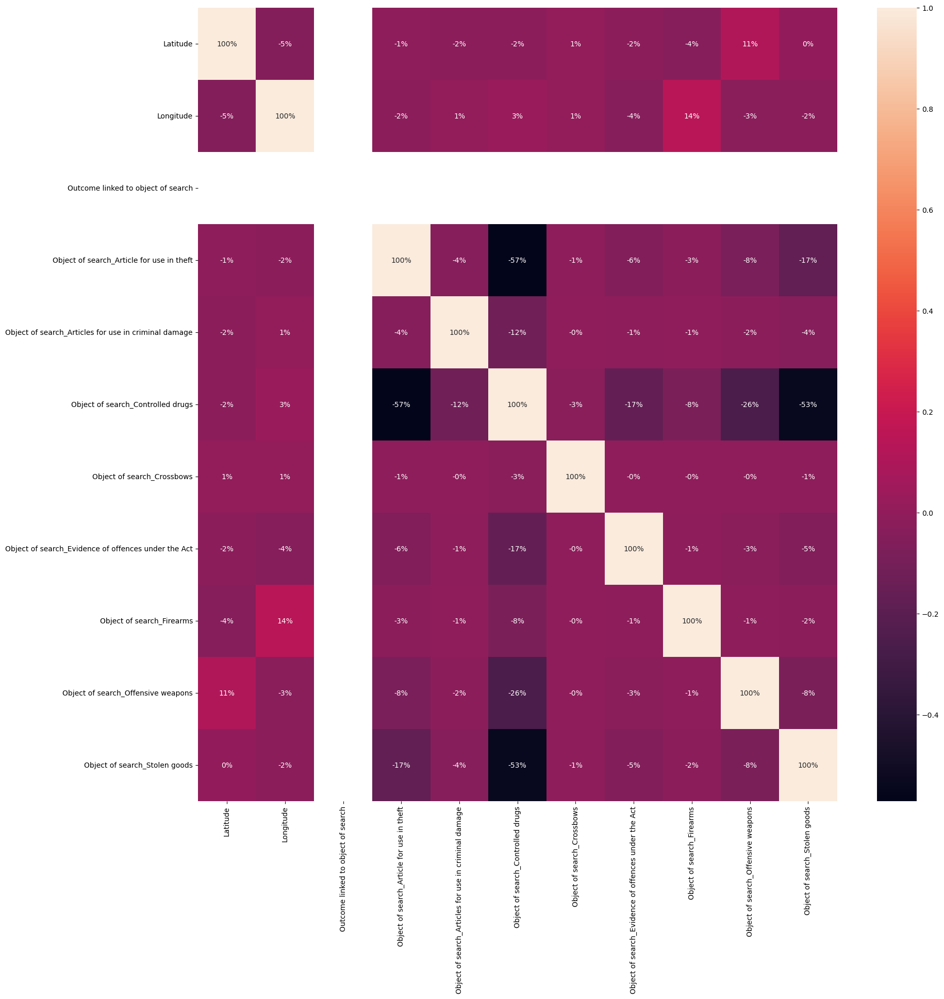

In [97]:
# plot heatmap to see the correlation between the features in thirdClean.csv
df = pd.read_csv('thirdClean.csv')
df = df.drop(df.columns[0], axis=1)
df.info()
df.head()
df.corr()
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True, fmt='.0%')
plt.show()



more clean

In [98]:
#  Load the data as time series
df = pd.read_csv('thirdClean.csv', index_col=0, parse_dates=True)
df.head()
df.info

<bound method DataFrame.info of                      Date   Latitude  Longitude  \
0     2019-12-01 02:17:49  51.513952  -0.085833   
1     2019-12-02 03:14:04  51.511625  -0.081549   
2     2019-12-02 04:51:16  51.509775  -0.085014   
3     2019-12-03 09:48:08  51.517431  -0.082458   
4     2019-12-04 02:53:26  51.516814  -0.081620   
...                   ...        ...        ...   
2089  2022-11-25 19:05:03  51.517239  -0.106076   
2090  2022-11-25 21:26:30  51.511190  -0.085228   
2091  2022-11-26 21:42:06  51.512770  -0.118367   
2092  2022-11-27 00:46:46  51.518461  -0.097103   
2093  2022-11-29 17:06:28  51.511896  -0.091540   

      Outcome linked to object of search  \
0                                      1   
1                                      1   
2                                      1   
3                                      1   
4                                      1   
...                                  ...   
2089                                   1   
209

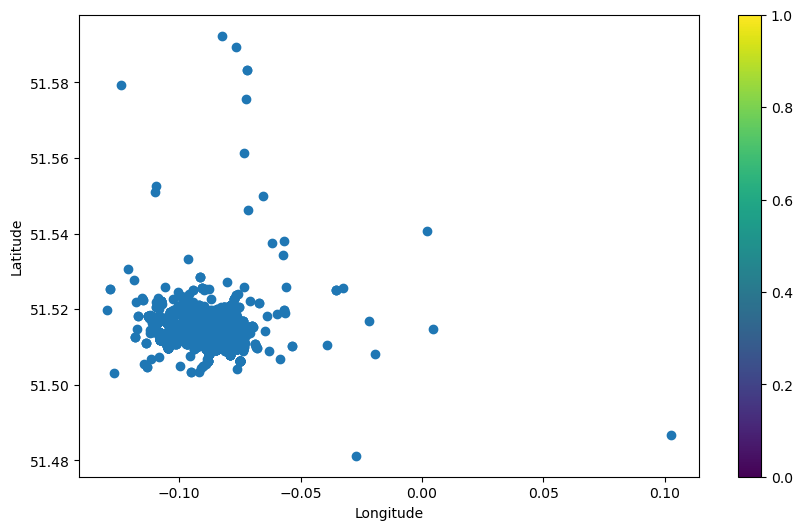

In [99]:
# latitudes and longitudes on graph to check for hotspots
plt.figure(figsize=(10, 6))

plt.scatter(df['Longitude'], df['Latitude'], cmap='viridis')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar()
plt.show()

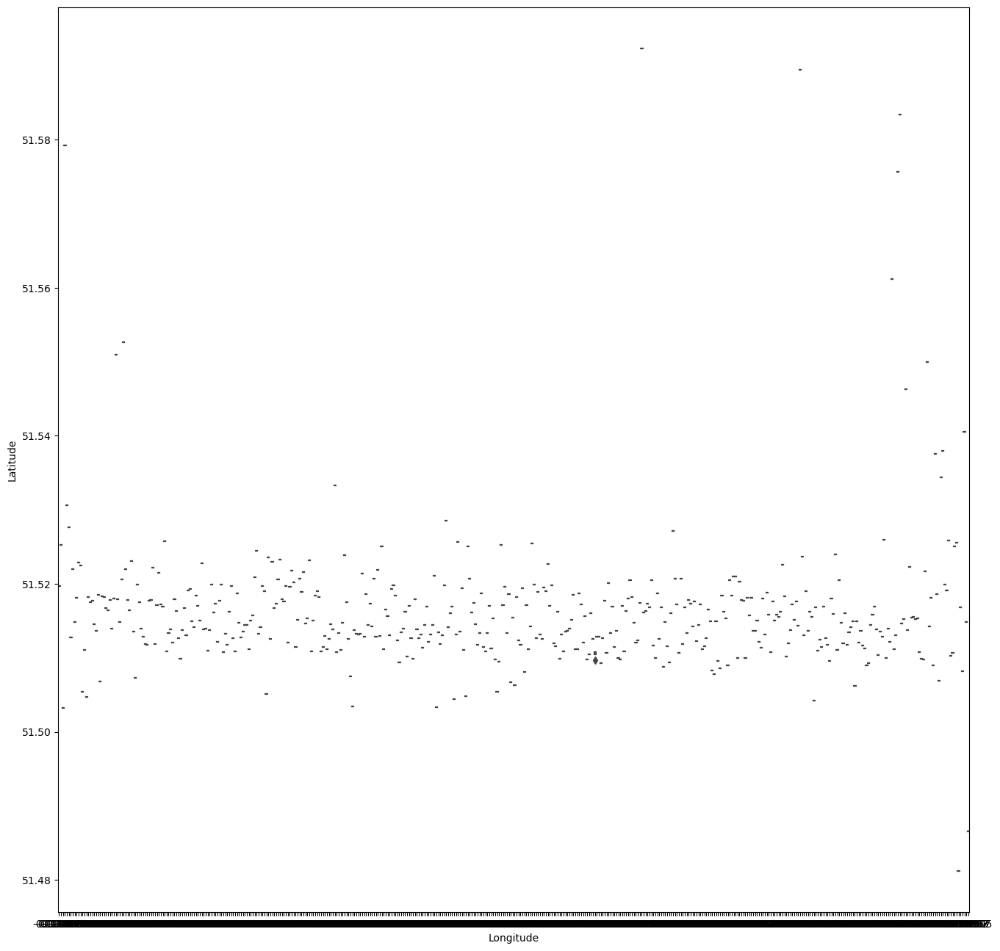

In [100]:
# boxplot combined lat and long to create a heatmap
plt.figure(figsize=(16, 16))
sns.boxplot(x='Longitude', y='Latitude', data=df)
plt.show()

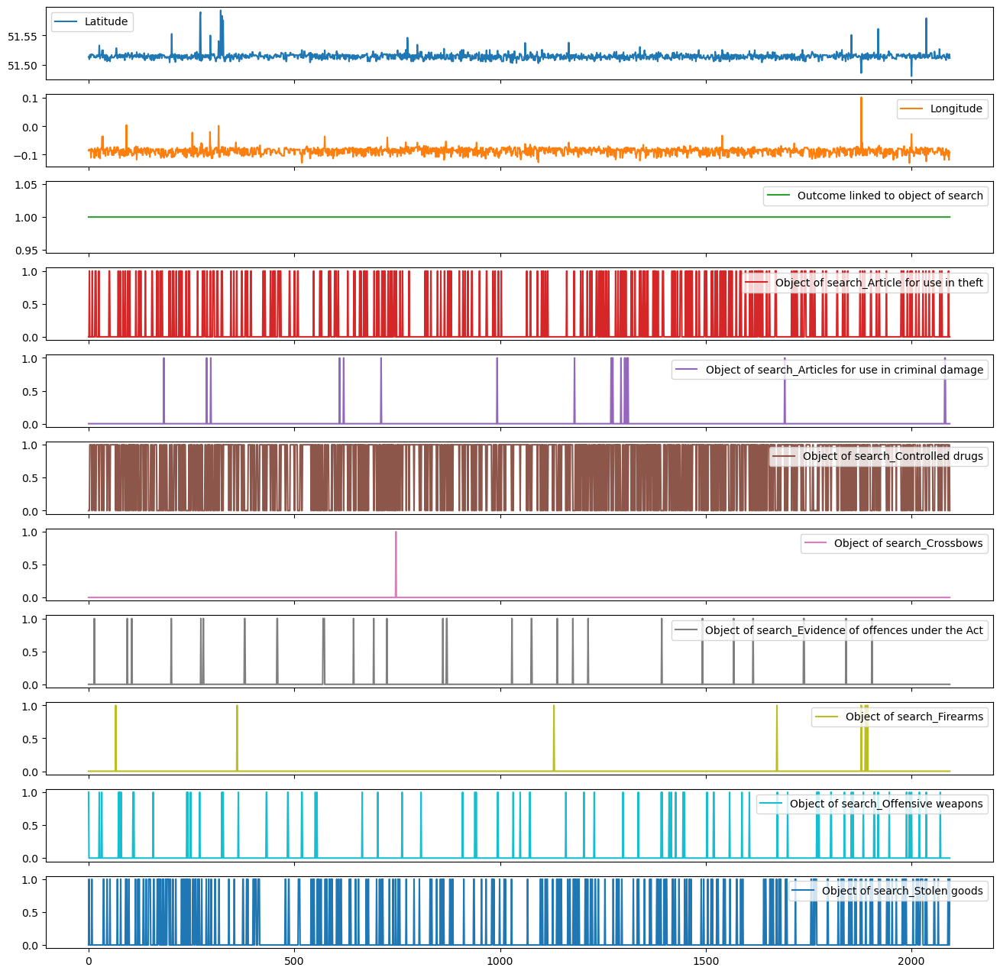

In [101]:
plot = df.plot(subplots=True, figsize=(16, 16))
plt.show()

In [102]:
# drop outcome linked to object of search
df = df.drop(['Outcome linked to object of search'], axis=1)

C:\Users\admin\AppData\Local\Temp\ipykernel_21008\2746223090.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='viridis')


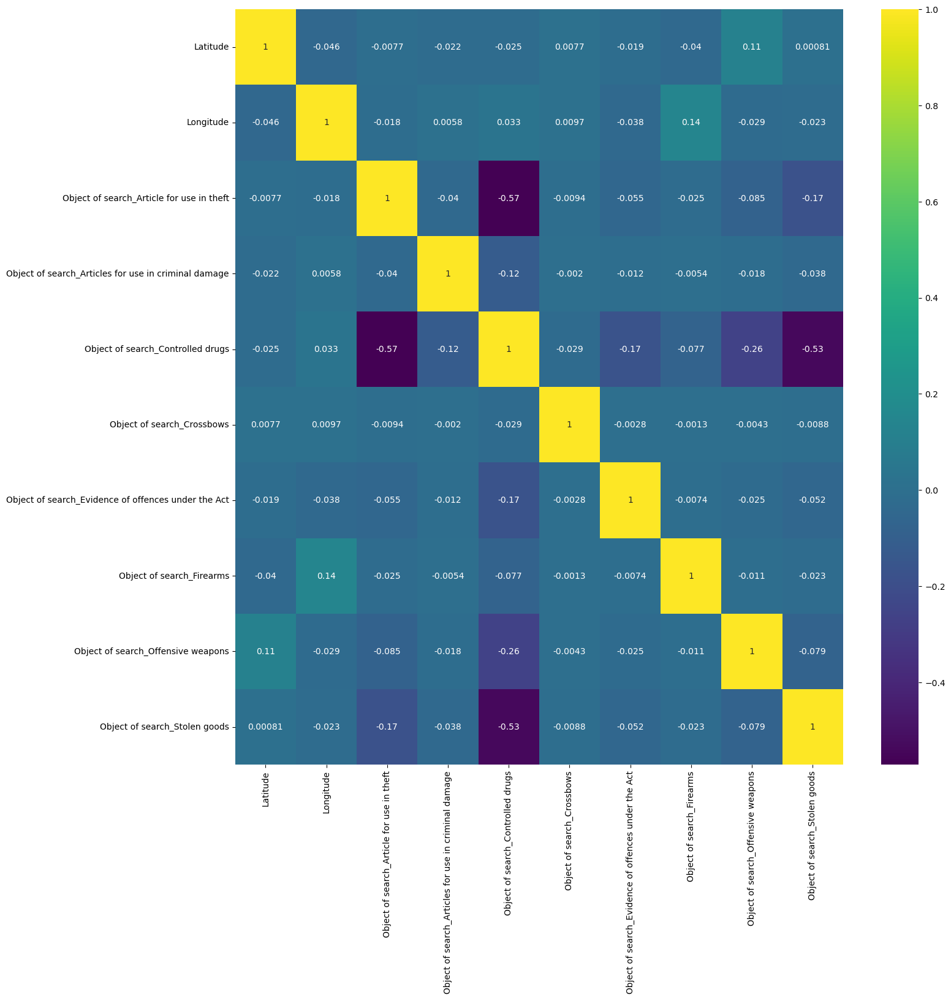

In [103]:
# heatmap to check for correlations
plt.figure(figsize=(16, 16))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()

In [104]:
# assume you have a DataFrame "df" with a column "Date"
df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Month'] = pd.to_datetime(df['Date']).dt.month
df['Day'] = pd.to_datetime(df['Date']).dt.day
df['Hour'] = pd.to_datetime(df['Date']).dt.hour
df['Minute'] = pd.to_datetime(df['Date']).dt.minute
df['Second'] = pd.to_datetime(df['Date']).dt.second
# drop the Date column
df = df.drop(columns=['Date'])
# display the dataframe
df.to_csv('fourthClean.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2093
Data columns (total 16 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Latitude                                              2094 non-null   float64
 1   Longitude                                             2094 non-null   float64
 2   Object of search_Article for use in theft             2094 non-null   float64
 3   Object of search_Articles for use in criminal damage  2094 non-null   float64
 4   Object of search_Controlled drugs                     2094 non-null   float64
 5   Object of search_Crossbows                            2094 non-null   float64
 6   Object of search_Evidence of offences under the Act   2094 non-null   float64
 7   Object of search_Firearms                             2094 non-null   float64
 8   Object of search_Offensive weapons                    2094

In [105]:
df = pd.read_csv('fourthClean.csv')
df = df.drop(df.columns[0], axis=1)
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2094 entries, 0 to 2093
Data columns (total 16 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Latitude                                              2094 non-null   float64
 1   Longitude                                             2094 non-null   float64
 2   Object of search_Article for use in theft             2094 non-null   float64
 3   Object of search_Articles for use in criminal damage  2094 non-null   float64
 4   Object of search_Controlled drugs                     2094 non-null   float64
 5   Object of search_Crossbows                            2094 non-null   float64
 6   Object of search_Evidence of offences under the Act   2094 non-null   float64
 7   Object of search_Firearms                             2094 non-null   float64
 8   Object of search_Offensive weapons                    2094

In [106]:
# create version with only latitude,longtitude,year,month,day,hour,minute,second
df2 = df[['Latitude','Longitude','Year','Month','Day','Hour','Minute','Second']]
df2.info()
df2.to_csv('fifthClean.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2094 entries, 0 to 2093
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Latitude   2094 non-null   float64
 1   Longitude  2094 non-null   float64
 2   Year       2094 non-null   int64  
 3   Month      2094 non-null   int64  
 4   Day        2094 non-null   int64  
 5   Hour       2094 non-null   int64  
 6   Minute     2094 non-null   int64  
 7   Second     2094 non-null   int64  
dtypes: float64(2), int64(6)
memory usage: 131.0 KB


<h3>Focusing on single crime type<h3> 09/02/2023

In [107]:
# load first clean data and work beyond this point
df = pd.read_csv('firstClean.csv')
df.head()

,Unnamed: 0,Type,Date,Latitude,Longitude,Object of search,Outcome linked to object of search
0,1,Person search,2019-12-01T02:17:49+00:00,51.513952,-0.085833,Offensive weapons,1
1,5,Person search,2019-12-02T03:14:04+00:00,51.511625,-0.081549,Stolen goods,1
2,6,Person search,2019-12-02T04:51:16+00:00,51.509775,-0.085014,Article for use in theft,1
3,10,Person search,2019-12-03T09:48:08+00:00,51.517431,-0.082458,Controlled drugs,1
4,12,Person search,2019-12-04T02:53:26+00:00,51.516814,-0.081620,Controlled drugs,1


In [108]:
# drop unnecessary columns
df = df.drop(df.columns[0], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2094 entries, 0 to 2093
Data columns (total 6 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                2094 non-null   object 
 1   Date                                2094 non-null   object 
 2   Latitude                            2094 non-null   float64
 3   Longitude                           2094 non-null   float64
 4   Object of search                    2094 non-null   object 
 5   Outcome linked to object of search  2094 non-null   int64  
dtypes: float64(2), int64(1), object(3)
memory usage: 98.3+ KB


In [109]:
# count the number of each type of object of search
df['Object of search'].value_counts()

Controlled drugs                       1333
Article for use in theft                329
Stolen goods                            294
Offensive weapons                        78
Evidence of offences under the Act       34
Articles for use in criminal damage      18
Firearms                                  7
Crossbows                                 1
Name: Object of search, dtype: int64

By inspecting the object of search column, I found that there are total of 8 crime types being recorded in the dataset. I will focus on the crime type "Controlled drugs" as it is the most occurring crime type in the dataset. I will narrow down the dataset to only include rows where the "Object of search" column is "Controlled drugs". This will result in a dataset that is more relevant to my goal of predicting the location and time of a crime.

In [110]:
# extract only the rows with object of search = 'Controlled drugs'
df = df[df['Object of search'] == 'Controlled drugs']
df.info()
# print the df
df.head()
# because the data is now only controlled drugs, drop the object of search column as it is no longer needed
df = df.drop(columns=['Object of search'])
df.info()
df.head()
# drop the outcome linked to object of search column as it is no longer needed as it is only true values
df = df.drop(columns=['Outcome linked to object of search'])
df.info()
df.head()
# data feature engineering 
df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Month'] = pd.to_datetime(df['Date']).dt.month
df['Day'] = pd.to_datetime(df['Date']).dt.day
df['Hour'] = pd.to_datetime(df['Date']).dt.hour
df['Minute'] = pd.to_datetime(df['Date']).dt.minute
df['Second'] = pd.to_datetime(df['Date']).dt.second
# drop the Date column
df = df.drop(columns=['Date'])
df.info()
df.head()
# save as csv file
df.to_csv('sixthClean.csv')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1333 entries, 3 to 2092
Data columns (total 6 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                1333 non-null   object 
 1   Date                                1333 non-null   object 
 2   Latitude                            1333 non-null   float64
 3   Longitude                           1333 non-null   float64
 4   Object of search                    1333 non-null   object 
 5   Outcome linked to object of search  1333 non-null   int64  
dtypes: float64(2), int64(1), object(3)
memory usage: 72.9+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1333 entries, 3 to 2092
Data columns (total 5 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                1333 non-null   object 
 1   Date 

<h1>calculate survial time</h1>15/02/2023


In [111]:
# load secondClean.csv and work beyond this point
df = pd.read_csv('firstClean.csv')
# drop the first column
df = df.drop(df.columns[0], axis=1)

In [112]:
# check for null values
df.isnull().sum()

Type                                  0
Date                                  0
Latitude                              0
Longitude                             0
Object of search                      0
Outcome linked to object of search    0
dtype: int64

In [113]:
# keep only Controlled drugs in the object of search column
df = df[df['Object of search'] == 'Controlled drugs']
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1333 entries, 3 to 2092
Data columns (total 6 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                1333 non-null   object 
 1   Date                                1333 non-null   object 
 2   Latitude                            1333 non-null   float64
 3   Longitude                           1333 non-null   float64
 4   Object of search                    1333 non-null   object 
 5   Outcome linked to object of search  1333 non-null   int64  
dtypes: float64(2), int64(1), object(3)
memory usage: 72.9+ KB


In [114]:
# print head
df.head()

,Type,Date,Latitude,Longitude,Object of search,Outcome linked to object of search
3,Person search,2019-12-03T09:48:08+00:00,51.517431,-0.082458,Controlled drugs,1
4,Person search,2019-12-04T02:53:26+00:00,51.516814,-0.081620,Controlled drugs,1
5,Person search,2019-12-04T03:15:57+00:00,51.513114,-0.086272,Controlled drugs,1
6,Person search,2019-12-04T06:36:19+00:00,51.518060,-0.110683,Controlled drugs,1
7,Person search,2019-12-04T12:37:18+00:00,51.517680,-0.078484,Controlled drugs,1


In [115]:
df = df.drop(columns=['Type'])

In [116]:
# drop the object of search column and outcome linked to object of search column as they are no longer needed 
df = df.drop(columns=['Object of search'])
df = df.drop(columns=['Outcome linked to object of search'])

In [117]:
df.head()

,Date,Latitude,Longitude
3,2019-12-03T09:48:08+00:00,51.517431,-0.082458
4,2019-12-04T02:53:26+00:00,51.516814,-0.081620
5,2019-12-04T03:15:57+00:00,51.513114,-0.086272
6,2019-12-04T06:36:19+00:00,51.518060,-0.110683
7,2019-12-04T12:37:18+00:00,51.517680,-0.078484


In [118]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1333 entries, 3 to 2092
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1333 non-null   object 
 1   Latitude   1333 non-null   float64
 2   Longitude  1333 non-null   float64
dtypes: float64(2), object(1)
memory usage: 41.7+ KB


In [119]:
# convert date to timestamp
df['Date'] = pd.to_datetime(df['Date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1333 entries, 3 to 2092
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype              
---  ------     --------------  -----              
 0   Date       1333 non-null   datetime64[ns, UTC]
 1   Latitude   1333 non-null   float64            
 2   Longitude  1333 non-null   float64            
dtypes: datetime64[ns, UTC](1), float64(2)
memory usage: 41.7 KB


In [120]:
# calculate the time difference between the date in the data column and the date in the date column and save it in a new column called time difference
df['Time difference'] = df['Date'].shift(-1) - df['Date']
df.head()

,Date,Latitude,Longitude,Time difference
3,2019-12-03 09:48:08+00:00,51.517431,-0.082458,0 days 17:05:18
4,2019-12-04 02:53:26+00:00,51.516814,-0.081620,0 days 00:22:31
5,2019-12-04 03:15:57+00:00,51.513114,-0.086272,0 days 03:20:22
6,2019-12-04 06:36:19+00:00,51.518060,-0.110683,0 days 06:00:59
7,2019-12-04 12:37:18+00:00,51.517680,-0.078484,0 days 17:35:50


In [121]:
# convert the time difference column to seconds and save in the next row
df['Time difference'] = df['Time difference'].dt.total_seconds() 
df.head()

,Date,Latitude,Longitude,Time difference
3,2019-12-03 09:48:08+00:00,51.517431,-0.082458,61518.0
4,2019-12-04 02:53:26+00:00,51.516814,-0.081620,1351.0
5,2019-12-04 03:15:57+00:00,51.513114,-0.086272,12022.0
6,2019-12-04 06:36:19+00:00,51.518060,-0.110683,21659.0
7,2019-12-04 12:37:18+00:00,51.517680,-0.078484,63350.0


In [122]:
# summeray
df.describe()

,Latitude,Longitude,Time difference
count,1333.000000,1333.000000,1332.000000
mean,51.514669,-0.086765,70678.316817
std,0.005592,0.012269,98584.496219
min,51.503196,-0.127032,0.000000
25%,51.511794,-0.094720,3873.500000
50%,51.514457,-0.084701,29088.000000
75%,51.517032,-0.078484,88748.750000
max,51.592365,0.004717,768764.000000


In [123]:
# save as csv file 
df.to_csv('seventhClean.csv')

<h1>calculate survial time in months</h1>16/02/2023

In [124]:
# load secondClean.csv and work beyond this point
df = pd.read_csv('firstClean.csv')
# drop the first column
df = df.drop(df.columns[0], axis=1)

In [125]:
# check for null values
df.isnull().sum()

Type                                  0
Date                                  0
Latitude                              0
Longitude                             0
Object of search                      0
Outcome linked to object of search    0
dtype: int64

In [126]:
# keep only Controlled drugs in the object of search column
df = df[df['Object of search'] == 'Controlled drugs']
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1333 entries, 3 to 2092
Data columns (total 6 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Type                                1333 non-null   object 
 1   Date                                1333 non-null   object 
 2   Latitude                            1333 non-null   float64
 3   Longitude                           1333 non-null   float64
 4   Object of search                    1333 non-null   object 
 5   Outcome linked to object of search  1333 non-null   int64  
dtypes: float64(2), int64(1), object(3)
memory usage: 72.9+ KB


In [127]:
df = df.drop(columns=['Type'])
# drop the object of search column and outcome linked to object of search column as they are no longer needed 
df = df.drop(columns=['Object of search'])
df = df.drop(columns=['Outcome linked to object of search'])

In [128]:
# convert date to timestamp
df['Date'] = pd.to_datetime(df['Date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1333 entries, 3 to 2092
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype              
---  ------     --------------  -----              
 0   Date       1333 non-null   datetime64[ns, UTC]
 1   Latitude   1333 non-null   float64            
 2   Longitude  1333 non-null   float64            
dtypes: datetime64[ns, UTC](1), float64(2)
memory usage: 41.7 KB


In [129]:
# calculate the time difference between the date in the data column and the date in the date column and save it in a new column called time difference
df['Time difference'] = df['Date'].shift(-1) - df['Date']
df.head()

,Date,Latitude,Longitude,Time difference
3,2019-12-03 09:48:08+00:00,51.517431,-0.082458,0 days 17:05:18
4,2019-12-04 02:53:26+00:00,51.516814,-0.081620,0 days 00:22:31
5,2019-12-04 03:15:57+00:00,51.513114,-0.086272,0 days 03:20:22
6,2019-12-04 06:36:19+00:00,51.518060,-0.110683,0 days 06:00:59
7,2019-12-04 12:37:18+00:00,51.517680,-0.078484,0 days 17:35:50


In [130]:
# convert the time difference column to month and save in the next row
df['Time difference in months'] = df['Time difference'].dt.days / 30.44
df['Time difference in weeks'] = df['Time difference'].dt.days / 7
df['Time difference in hours'] = df['Time difference'].dt.total_seconds() / 3600
df.head()

,Date,Latitude,Longitude,Time difference,Time difference in months,Time difference in weeks,Time difference in hours
3,2019-12-03 09:48:08+00:00,51.517431,-0.082458,0 days 17:05:18,0.0,0.0,17.088333
4,2019-12-04 02:53:26+00:00,51.516814,-0.081620,0 days 00:22:31,0.0,0.0,0.375278
5,2019-12-04 03:15:57+00:00,51.513114,-0.086272,0 days 03:20:22,0.0,0.0,3.339444
6,2019-12-04 06:36:19+00:00,51.518060,-0.110683,0 days 06:00:59,0.0,0.0,6.016389
7,2019-12-04 12:37:18+00:00,51.517680,-0.078484,0 days 17:35:50,0.0,0.0,17.597222


In [131]:
df.to_csv('eighthClean.csv')